<span style="color: #ae1400; Segoe UI; font-size: 2.0em; font-weight: 300;">Overview</span>

<p style='text-align: justify;'><span style="font-family: Trebuchet MS; font-size: 1.2em;"> This notebook explores the different ways to select or fuse multiple bboxes of the same chest abnormality, annotated by several radiologists</span></p>

<p style='text-align: justify;'><span style="font-family: Trebuchet MS; font-size: 1.2em;"> It also covers the conversion of custom bbox annotations to the YoLo format for frameworks such as YOLO etc</span></p>


**A few key intricacies in this competetion includes the way the training data is provided. To state a few:** 

- **The abnormalities are labelled by multiple radiologists and there seems to be multiple bounding boxes for some abnormalities.**

- **Another issue being that some dense abnormality/lesion area may contain multiple labels. The radiologists creates boxes and then they may assign many labels to a single bounding box. This was stated by one of the competetion hosts.**

So the challenge of this competetion includes handling these issues before or after model training.Some ways to handle this would be to use suppression, selection or fusion techniques below which are covered in this notebook:

- **Non-maximum Suppression (NMS)**
- **Soft-NMS**
- **Non-maximum Weighted (NMW)**
- **Weighted Bboxes Fusion (WBF)**



These are generally used after model scoring to get to a consensus of a bounding box where the abnormality is based on the confidence scores, weightage of different models (if ensembling is used) etc.

Here, the challenge lies in the fact that we don't have confidence scores or metrics to assign weightage to the multiple annotations by radiologists. So all radiologists are treated equally and the suppression or fusion of bounding boxes has to be done with these factors out of the picture. This seems to show a behaviour by which the bounding boxes which appear alone, seems to get suppressed. This issue is handled in this notebook by separating out single bounding boxes before any technique is applied.

**Finally, please feel free to suggest any other novel methods to address these issues. Hope everyone finds this useful!**



<br />
<br />


<p style='text-align: justify;'><span style="color: #ae1400; Segoe UI; font-size: 1.2em; font-weight: 300;">Check out the training notebook which uses the Yolo dataset generated here. It explains the Installation, Data preparation, Training and Inference using the Yolov8 model l. It can be adapted to various other models with just 1-2 lines of code change.</span></p>


<p style='text-align: justify;'><span style="font-family: Trebuchet MS; font-size: 1.1em;">vincxr-yolov8l⚡📈</span></p>


TRAINING NOTEBOOK - https://www.kaggle.com/code/buithanhxuan/vincxr-yolov8l

<br />
<br />

<p style='text-align: justify;'><span style="color: #ae1400; Segoe UI; font-size: 1.2em; font-weight: 300;">The Yolo dataset with Fused Boxes generated as a part of this notebook is public. Please do check it out.</span></p>


<p style='text-align: justify;'><span style="font-family: Trebuchet MS; font-size: 1.1em;">VinBigData - Yolo Dataset with WBF 3x Downscaled</span></p>


DATASET LINK - https://www.kaggle.com/datasets/buithanhxuan/vinbigdata-yolo-dataset-with-wbf-3x-downscaled

**Please note that All images with Chest Abnormalities are present in this dataset.**

<br />
<br />

**Class Mapping in the Annotations File:**

    0 - Aortic enlargement
    1 - Atelectasis
    2 - Calcification
    3 - Cardiomegaly
    4 - Consolidation
    5 - ILD
    6 - Infiltration
    7 - Lung Opacity
    8 - Nodule/Mass
    9 - Other lesion
    10 - Pleural effusion
    11 - Pleural thickening
    12 - Pneumothorax
    13 - Pulmonary fibrosis
    14 - No finding
 
 
### Citations:

**Thanks to [corochann](http://https://www.kaggle.com/corochann) for creating the vinbigdata-chest-xray-original-png which is used here:
https://www.kaggle.com/datasets/corochann/vinbigdata-chest-xray-original-png**

**[Weighted Boxes Fusion: ensembling boxes for object detection models paper](https://arxiv.org/abs/1910.13302)**


<br />
<br />

[![Ask Me Anything !](https://img.shields.io/badge/Ask%20me-something-1abc9c.svg?style=flat-square&logo=kaggle)](https://www.kaggle.com/buithanhxuan)
<br />

![Upvote!](https://img.shields.io/badge/Upvote-If%20you%20like%20my%20work-07b3c8?style=for-the-badge&logo=kaggle)

![](https://www.futuretimeline.net/blog/images/1466-chest-xray-ai-technology.jpg)

<p style='text-align: center;'><span style="color: #0D0D0D; font-family: Segoe UI; font-size: 2.6em; font-weight: 300;">VINBIGDATA - FUSING BBOXES + BUILDING YOLO DATASET 640px</span></p>




In [1]:
!pip install -q ensemble-boxes

In [2]:
%matplotlib inline

import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams
sns.set(rc={"font.size":9,"axes.titlesize":15,"axes.labelsize":9,
            "axes.titlepad":11, "axes.labelpad":9, "legend.fontsize":7,
            "legend.title_fontsize":7, 'axes.grid' : False})
import cv2
import json
import pandas as pd
import glob
import os.path as osp
from path import Path
import datetime
import numpy as np
from tqdm.auto import tqdm
import random
import shutil
from sklearn.model_selection import train_test_split

from ensemble_boxes import *
import warnings
from collections import Counter

## Loading the Annotation CSV

In [3]:
train_annotations = pd.read_csv("/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv")
train_annotations.head(5)

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN


## Selecting Images with Abnormalities

In [4]:
train_annotations = train_annotations[train_annotations.class_id!=14]
train_annotations['image_path'] = train_annotations['image_id'].map(lambda x:os.path.join('/kaggle/input/vinbigdata-chest-xray-original-png/train', str(x)+'.png'))
train_annotations.head(5)

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,image_path
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,/kaggle/input/vinbigdata-chest-xray-original-p...
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,/kaggle/input/vinbigdata-chest-xray-original-p...
5,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0,/kaggle/input/vinbigdata-chest-xray-original-p...
6,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,/kaggle/input/vinbigdata-chest-xray-original-p...
7,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0,/kaggle/input/vinbigdata-chest-xray-original-p...


In [5]:
img_size_df = pd.read_csv('/kaggle/input/vinbigdata-chest-xray-original-png/train_meta.csv', names=['image_id', 'orig_height', 'orig_width'])

# Merge the original image size information with the training data
train_annotations = train_annotations.merge(img_size_df, on='image_id', how='left')
train_annotations.head(5)

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,image_path,orig_height,orig_width
0,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,/kaggle/input/vinbigdata-chest-xray-original-p...,2336,2080
1,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,/kaggle/input/vinbigdata-chest-xray-original-p...,2880,2304
2,1c32170b4af4ce1a3030eb8167753b06,Pleural thickening,11,R9,627.0,357.0,947.0,433.0,/kaggle/input/vinbigdata-chest-xray-original-p...,3072,2540
3,0c7a38f293d5f5e4846aa4ca6db4daf1,ILD,5,R17,1347.0,245.0,2188.0,2169.0,/kaggle/input/vinbigdata-chest-xray-original-p...,2555,2285
4,47ed17dcb2cbeec15182ed335a8b5a9e,Nodule/Mass,8,R9,557.0,2352.0,675.0,2484.0,/kaggle/input/vinbigdata-chest-xray-original-p...,3353,2568


In [6]:
imagepaths = train_annotations['image_path'].unique()
print("Number of Images with abnormalities:",len(imagepaths))
anno_count = train_annotations.shape[0]
print("Number of Annotations with abnormalities:", anno_count)

Number of Images with abnormalities: 4394
Number of Annotations with abnormalities: 36096


## Helper Functions

In [7]:
def plot_img(img, size=(18, 18), is_rgb=True, title="", cmap='gray'):
    plt.figure(figsize=size)
    plt.imshow(img, cmap=cmap)
    plt.suptitle(title)
    plt.show()

def plot_imgs(imgs, cols=2, size=10, is_rgb=True, title="", cmap='gray', img_size=None):
    rows = len(imgs)//cols + 1
    fig = plt.figure(figsize=(cols*size, rows*size))
    for i, img in enumerate(imgs):
        if img_size is not None:
            img = cv2.resize(img, img_size)
        fig.add_subplot(rows, cols, i+1)
        plt.imshow(img, cmap=cmap)
    plt.suptitle(title)
    
def draw_bbox(image, box, label, color):   
    alpha = 0.1
    alpha_box = 0.4
    overlay_bbox = image.copy()
    overlay_text = image.copy()
    output = image.copy()

    text_width, text_height = cv2.getTextSize(label.upper(), cv2.FONT_HERSHEY_SIMPLEX, 0.6, 1)[0]
    cv2.rectangle(overlay_bbox, (box[0], box[1]), (box[2], box[3]),
                color, -1)
    cv2.addWeighted(overlay_bbox, alpha, output, 1 - alpha, 0, output)
    cv2.rectangle(overlay_text, (box[0], box[1]-7-text_height), (box[0]+text_width+2, box[1]),
                (0, 0, 0), -1)
    cv2.addWeighted(overlay_text, alpha_box, output, 1 - alpha_box, 0, output)
    cv2.rectangle(output, (box[0], box[1]), (box[2], box[3]),
                    color, thickness)
    cv2.putText(output, label.upper(), (box[0], box[1]-5),
            cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1, cv2.LINE_AA)
    return output

## Define Classes

In [8]:
labels =  [
            "__ignore__",
            "Aortic_enlargement",
            "Atelectasis",
            "Calcification",
            "Cardiomegaly",
            "Consolidation",
            "ILD",
            "Infiltration",
            "Lung_Opacity",
            "Nodule/Mass",
            "Other_lesion",
            "Pleural_effusion",
            "Pleural_thickening",
            "Pneumothorax",
            "Pulmonary_fibrosis"
            ]
viz_labels = labels[1:]

## Visualize Original Bboxes

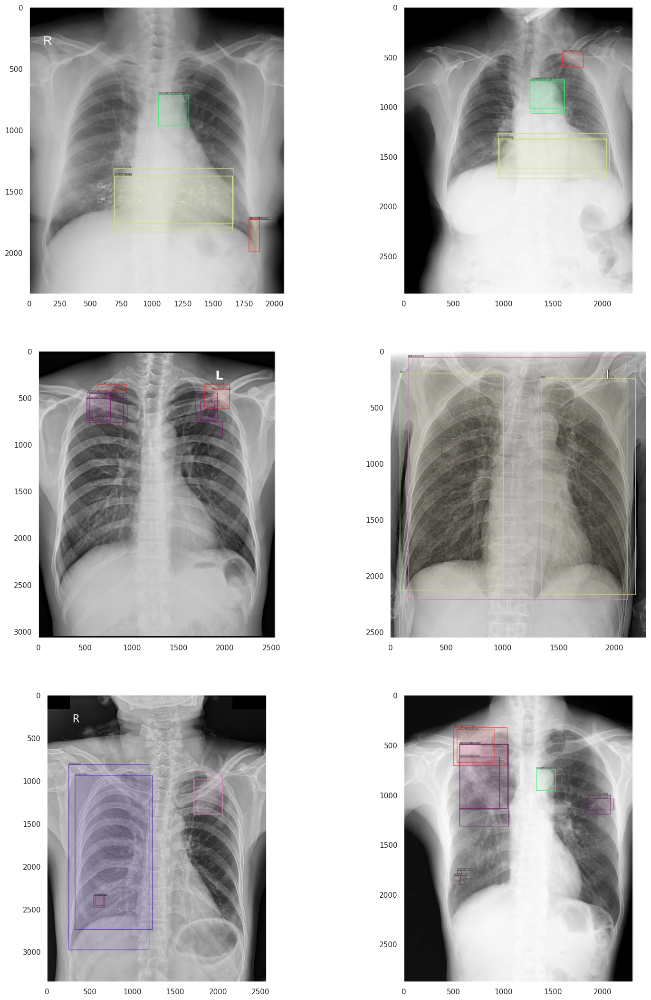

In [9]:
# map label_id to specify color
#label2color = [[random.randint(0,255) for i in range(3)] for class_id in viz_labels]
label2color = [[59, 238, 119], [222, 21, 229], [94, 49, 164], [206, 221, 133], [117, 75, 3],
                 [210, 224, 119], [211, 176, 166], [63, 7, 197], [102, 65, 77], [194, 134, 175],
                 [209, 219, 50], [255, 44, 47], [89, 125, 149], [110, 27, 100]]

thickness = 3
imgs = []

for img_id, path in zip(train_annotations['image_id'][:6], train_annotations['image_path'][:6]):

    boxes = train_annotations.loc[train_annotations['image_id'] == img_id,
                                  ['x_min', 'y_min', 'x_max', 'y_max']].values
    img_labels = train_annotations.loc[train_annotations['image_id'] == img_id, ['class_id']].values.squeeze()
    
    img = cv2.imread(path)
    
    for label_id, box in zip(img_labels, boxes):
        color = label2color[label_id]
        img = draw_bbox(img, list(np.int_(box)), viz_labels[label_id], color)
    imgs.append(img)

plot_imgs(imgs, size=9, cmap=None)
plt.show()

# Exploring Techniques to Combine Bboxes
## Non-maximum Suppression (NMS)
### Non-maximum Suppression (NMS): Loại bỏ các bbox chồng chéo dựa trên ngưỡng Intersection over Union (IoU) và điểm tin cậy.

0it [00:00, ?it/s]

('d3637a1935a905b3c326af31389cb846', '/kaggle/input/vinbigdata-chest-xray-original-png/train/d3637a1935a905b3c326af31389cb846.png')
Bboxes before nms:
 [[1329.0, 743.0, 1521.0, 958.0], [1842.0, 1042.0, 2108.0, 1153.0], [496.0, 325.0, 1036.0, 709.0], [501.0, 1813.0, 569.0, 1865.0], [559.0, 496.0, 1041.0, 1137.0], [1838.0, 1004.0, 2076.0, 1195.0], [533.0, 350.0, 912.0, 674.0], [559.0, 492.0, 1052.0, 1316.0], [536.0, 1761.0, 579.0, 1790.0], [558.0, 1856.0, 612.0, 1902.0], [559.0, 622.0, 961.0, 1145.0]]
Labels before nms:
 [0, 13, 11, 8, 13, 13, 11, 13, 8, 8, 13]
Counter({13: 5, 8: 3, 11: 2, 0: 1})
Bboxes after nms:
 [[558.0, 1856.0, 612.0, 1902.0], [536.0, 1761.0, 579.0, 1790.0], [501.0, 1813.0, 569.0, 1865.0], [533.0, 350.0, 912.0, 674.0], [559.0, 622.0, 961.0, 1145.0], [1838.0, 1004.0, 2076.0, 1195.0], [1329.0, 743.0, 1521.0, 958.0]]
Labels after nms:
 [8, 8, 8, 11, 13, 13, 0]

('afb6230703512afc370f236e8fe98806', '/kaggle/input/vinbigdata-chest-xray-original-png/train/afb6230703512afc3

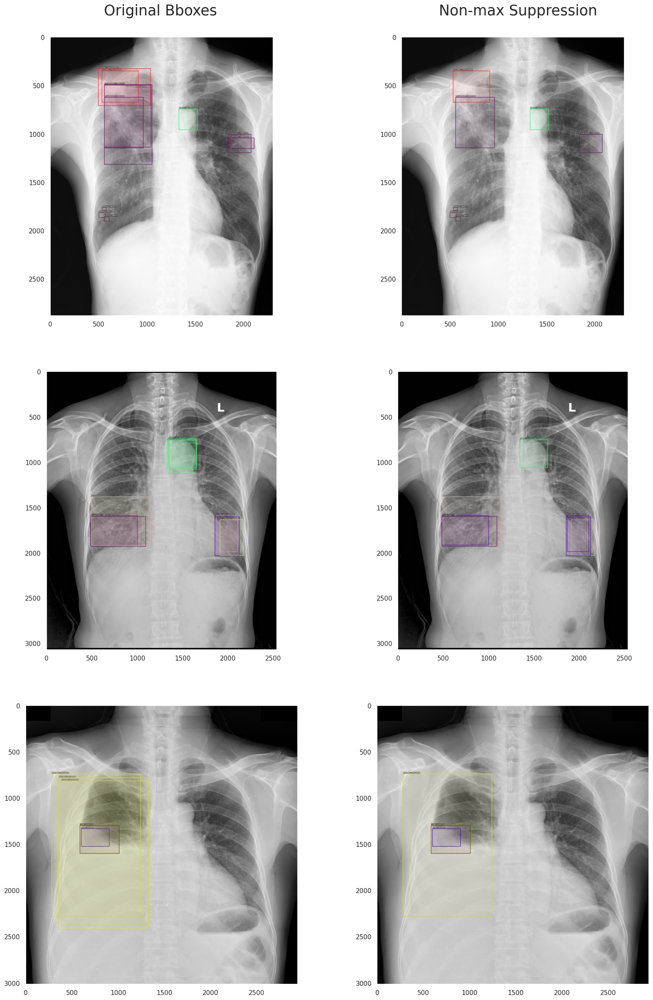

In [10]:
iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []

for i, path in tqdm(enumerate(imagepaths[5:8])):
    img_array  = cv2.imread(path)
    image_basename = Path(path).stem
    print(f"(\'{image_basename}\', \'{path}\')")
    img_annotations = train_annotations[train_annotations.image_id==image_basename]

    boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
    labels_viz = img_annotations['class_id'].to_numpy().tolist()
    
    print("Bboxes before nms:\n", boxes_viz)
    print("Labels before nms:\n", labels_viz)
    
    ## Visualize Original Bboxes
    img_before = img_array.copy()
    for box, label in zip(boxes_viz, labels_viz):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        color = label2color[int(label)]
        img_before = draw_bbox(img_before, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_before)
    
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    
    boxes_single = []
    labels_single = []
    
    cls_ids = img_annotations['class_id'].unique().tolist()
    count_dict = Counter(img_annotations['class_id'].tolist())
    print(count_dict)

    for cid in cls_ids:       
        ## Performing Fusing operation only for multiple bboxes with the same label
        if count_dict[cid]==1:
            labels_single.append(cid)
            boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

        else:
            cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
            labels_list.append(cls_list)
            bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
            ## Normalizing Bbox by Image Width and Height
            bbox = bbox/(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
            bbox = np.clip(bbox, 0, 1)
            boxes_list.append(bbox.tolist())
            scores_list.append(np.ones(len(cls_list)).tolist())

            weights.append(1)
            
    # Perform NMS
    boxes, scores, box_labels = nms(boxes_list, scores_list, labels_list, weights=weights,
                                    iou_thr=iou_thr)
    
    boxes = boxes*(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
    boxes = boxes.round(1).tolist()
    box_labels = box_labels.astype(int).tolist()

    boxes.extend(boxes_single)
    box_labels.extend(labels_single)
    
    print("Bboxes after nms:\n", boxes)
    print("Labels after nms:\n", box_labels)
    
    ## Visualize Bboxes after operation
    img_after = img_array.copy()
    for box, label in zip(boxes, box_labels):
        color = label2color[int(label)]
        img_after = draw_bbox(img_after, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_after)
    print()
        
plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"Non-max Suppression", va="top", ha="center", size=25)
plt.savefig('nms.png', bbox_inches='tight')
plt.show()

## Soft-NMS
### Soft-NMS: Tương tự như NMS nhưng giảm dần điểm tin cậy của các bbox chồng chéo thay vì loại bỏ chúng hoàn toàn.

0it [00:00, ?it/s]

('d3637a1935a905b3c326af31389cb846', '/kaggle/input/vinbigdata-chest-xray-original-png/train/d3637a1935a905b3c326af31389cb846.png')
Bboxes before soft_nms:
 [[1329.0, 743.0, 1521.0, 958.0], [1842.0, 1042.0, 2108.0, 1153.0], [496.0, 325.0, 1036.0, 709.0], [501.0, 1813.0, 569.0, 1865.0], [559.0, 496.0, 1041.0, 1137.0], [1838.0, 1004.0, 2076.0, 1195.0], [533.0, 350.0, 912.0, 674.0], [559.0, 492.0, 1052.0, 1316.0], [536.0, 1761.0, 579.0, 1790.0], [558.0, 1856.0, 612.0, 1902.0], [559.0, 622.0, 961.0, 1145.0]]
Labels before soft_nms:
 [0, 13, 11, 8, 13, 13, 11, 13, 8, 8, 13]
Counter({13: 5, 8: 3, 11: 2, 0: 1})
Bboxes after soft_nms:
 [[501.0, 1813.0, 569.0, 1865.0], [536.0, 1761.0, 579.0, 1790.0], [558.0, 1856.0, 612.0, 1902.0], [496.0, 325.0, 1036.0, 709.0], [533.0, 350.0, 912.0, 674.0], [1842.0, 1042.0, 2108.0, 1153.0], [559.0, 496.0, 1041.0, 1137.0], [1838.0, 1004.0, 2076.0, 1195.0], [559.0, 622.0, 961.0, 1145.0], [1329.0, 743.0, 1521.0, 958.0]]
Labels after soft_nms:
 [8, 8, 8, 11, 11, 1

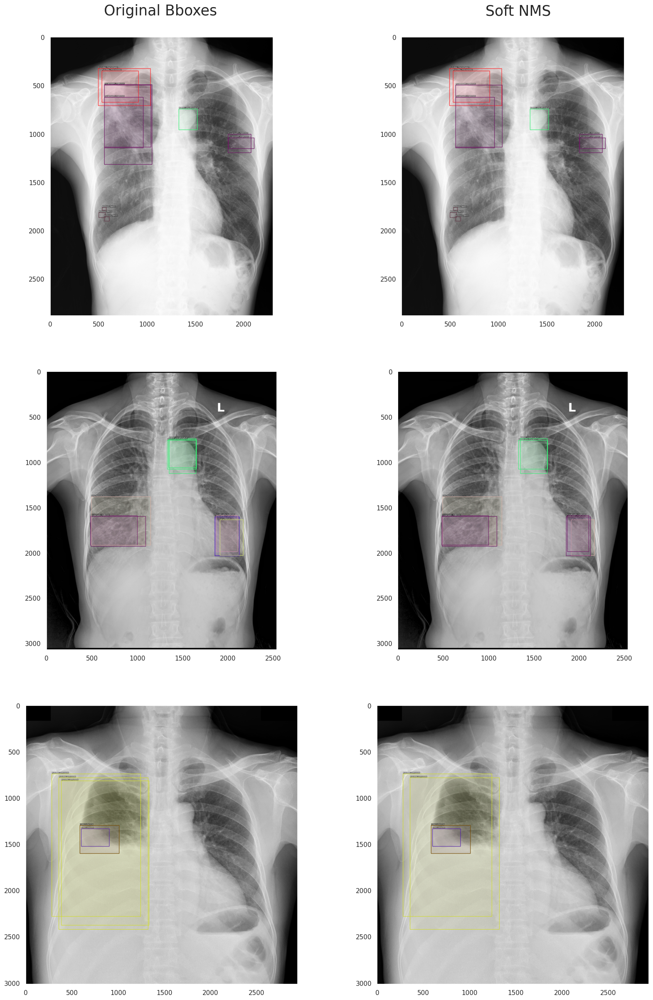

In [11]:
iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []
sigma = 0.1

for i, path in tqdm(enumerate(imagepaths[5:8])):
    img_array  = cv2.imread(path)
    image_basename = Path(path).stem
    print(f"(\'{image_basename}\', \'{path}\')")
    img_annotations = train_annotations[train_annotations.image_id==image_basename]
    
    boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
    labels_viz = img_annotations['class_id'].to_numpy().tolist()
    
    print("Bboxes before soft_nms:\n", boxes_viz)
    print("Labels before soft_nms:\n", labels_viz)
    
    ## Visualize Original Bboxes
    img_before = img_array.copy()
    for box, label in zip(boxes_viz, labels_viz):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        color = label2color[int(label)]
        img_before = draw_bbox(img_before, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_before)
    
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    
    boxes_single = []
    labels_single = []
    
    cls_ids = img_annotations['class_id'].unique().tolist()
    count_dict = Counter(img_annotations['class_id'].tolist())
    print(count_dict)

    for cid in cls_ids:       
        ## Performing Fusing operation only for multiple bboxes with the same label
        if count_dict[cid]==1:
            labels_single.append(cid)
            boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

        else:
            cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
            labels_list.append(cls_list)
            bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
            ## Normalizing Bbox by Image Width and Height
            bbox = bbox/(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
            bbox = np.clip(bbox, 0, 1)
            boxes_list.append(bbox.tolist())
            scores_list.append(np.ones(len(cls_list)).tolist())

            weights.append(1)
            
        
    # Perform Soft-NMS
    boxes, scores, box_labels = soft_nms(boxes_list, scores_list, labels_list, weights=weights,
                                         iou_thr=iou_thr, sigma=sigma, thresh=skip_box_thr)
    
    
    boxes = boxes*(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
    boxes = boxes.round(1).tolist()
    box_labels = box_labels.astype(int).tolist()
    
    boxes.extend(boxes_single)
    box_labels.extend(labels_single)
    
    print("Bboxes after soft_nms:\n", boxes)
    print("Labels after soft_nms:\n", box_labels)
    
    ## Visualize Bboxes after operation
    img_after = img_array.copy()
    for box, label in zip(boxes, box_labels):
        color = label2color[int(label)]
        img_after = draw_bbox(img_after, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_after)
    print()
        
plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"Soft NMS", va="top", ha="center", size=25)
plt.savefig('snms.png', bbox_inches='tight')
plt.show()

## Non-maximum Weighted
### Non-maximum Weighted (NMW): Tương tự như NMS nhưng sử dụng trọng số để ưu tiên các bbox từ các mô hình hoặc nguồn khác nhau.

0it [00:00, ?it/s]

('d3637a1935a905b3c326af31389cb846', '/kaggle/input/vinbigdata-chest-xray-original-png/train/d3637a1935a905b3c326af31389cb846.png')
Bboxes before non_maximum_weighted:
 [[1329.0, 743.0, 1521.0, 958.0], [1842.0, 1042.0, 2108.0, 1153.0], [496.0, 325.0, 1036.0, 709.0], [501.0, 1813.0, 569.0, 1865.0], [559.0, 496.0, 1041.0, 1137.0], [1838.0, 1004.0, 2076.0, 1195.0], [533.0, 350.0, 912.0, 674.0], [559.0, 492.0, 1052.0, 1316.0], [536.0, 1761.0, 579.0, 1790.0], [558.0, 1856.0, 612.0, 1902.0], [559.0, 622.0, 961.0, 1145.0]]
Labels before non_maximum_weighted:
 [0, 13, 11, 8, 13, 13, 11, 13, 8, 8, 13]
Counter({13: 5, 8: 3, 11: 2, 0: 1})
Bboxes after non_maximum_weighted:
 [[501.0, 1813.0, 569.0, 1865.0], [536.0, 1761.0, 579.0, 1790.0], [558.0, 1856.0, 612.0, 1902.0], [519.2, 340.7, 958.1, 687.0], [1839.4, 1017.2, 2087.1, 1180.5], [559.0, 552.8, 1006.9, 1183.2], [1329.0, 743.0, 1521.0, 958.0]]
Labels after non_maximum_weighted:
 [8, 8, 8, 11, 13, 13, 0]

('afb6230703512afc370f236e8fe98806', '/ka

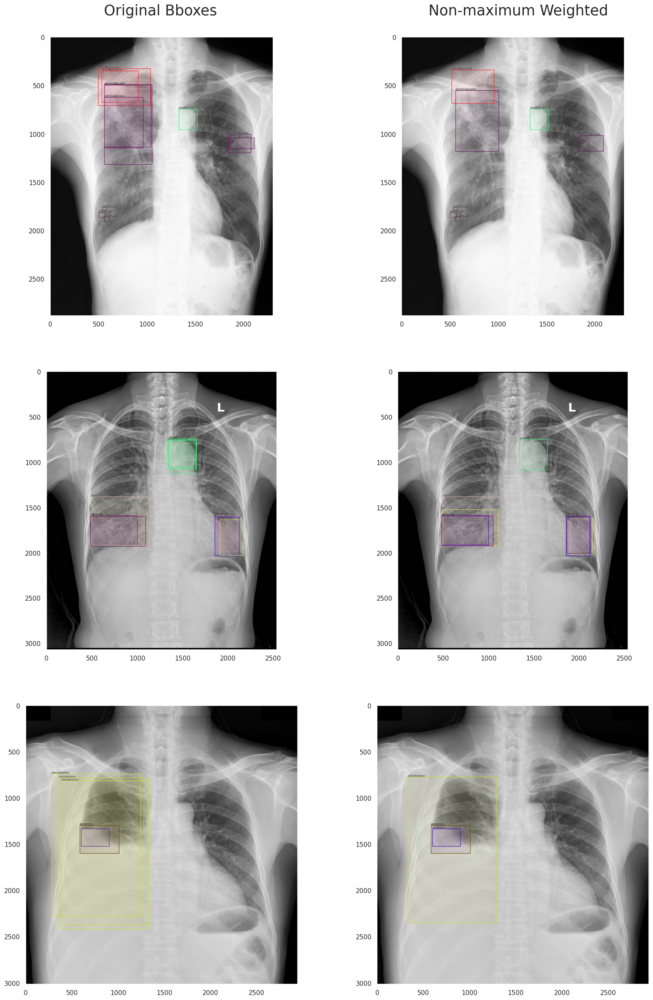

In [12]:
iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []

for i, path in tqdm(enumerate(imagepaths[5:8])):
    img_array  = cv2.imread(path)
    image_basename = Path(path).stem
    print(f"(\'{image_basename}\', \'{path}\')")
    img_annotations = train_annotations[train_annotations.image_id==image_basename]

    boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
    labels_viz = img_annotations['class_id'].to_numpy().tolist()
    
    print("Bboxes before non_maximum_weighted:\n", boxes_viz)
    print("Labels before non_maximum_weighted:\n", labels_viz)
    
    ## Visualize Original Bboxes
    img_before = img_array.copy()
    for box, label in zip(boxes_viz, labels_viz):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        color = label2color[int(label)]
        img_before = draw_bbox(img_before, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_before)
    
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    
    boxes_single = []
    labels_single = []
    
    cls_ids = img_annotations['class_id'].unique().tolist()
    count_dict = Counter(img_annotations['class_id'].tolist())
    print(count_dict)

    for cid in cls_ids:       
        ## Performing Fusing operation only for multiple bboxes with the same label
        if count_dict[cid]==1:
            labels_single.append(cid)
            boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

        else:
            cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
            labels_list.append(cls_list)
            bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
            ## Normalizing Bbox by Image Width and Height
            bbox = bbox/(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
            bbox = np.clip(bbox, 0, 1)
            boxes_list.append(bbox.tolist())
            scores_list.append(np.ones(len(cls_list)).tolist())

            weights.append(1)
            

    # Perform Non-maximum Weighted
    boxes, scores, box_labels = non_maximum_weighted(boxes_list, scores_list, labels_list,
                                                     weights=weights, iou_thr=iou_thr,skip_box_thr=skip_box_thr)
    
    boxes = boxes*(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
    boxes = boxes.round(1).tolist()
    box_labels = box_labels.astype(int).tolist()

    boxes.extend(boxes_single)
    box_labels.extend(labels_single)
    
    print("Bboxes after non_maximum_weighted:\n", boxes)
    print("Labels after non_maximum_weighted:\n", box_labels)
    
    ## Visualize Bboxes after operation
    img_after = img_array.copy()
    for box, label in zip(boxes, box_labels):
        color = label2color[int(label)]
        img_after = draw_bbox(img_after, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_after)
    print()
        
plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"Non-maximum Weighted", va="top", ha="center", size=25)
plt.savefig('nmw.png', bbox_inches='tight')
plt.show()

## Weighted boxes fusion (WBF)
### Weighted Boxes Fusion (WBF) là một kỹ thuật hiệu quả để kết hợp các dự đoán từ nhiều mô hình phát hiện đối tượng. Không giống như Non-Maximum Suppression (NMS) loại bỏ các hộp chồng chéo dựa trên điểm tin cậy, WBF sử dụng tất cả các hộp dự đoán để tính toán các hộp trung bình có trọng số.

0it [00:00, ?it/s]

('d3637a1935a905b3c326af31389cb846', '/kaggle/input/vinbigdata-chest-xray-original-png/train/d3637a1935a905b3c326af31389cb846.png')
Bboxes before WBF:
 [[1329.0, 743.0, 1521.0, 958.0], [1842.0, 1042.0, 2108.0, 1153.0], [496.0, 325.0, 1036.0, 709.0], [501.0, 1813.0, 569.0, 1865.0], [559.0, 496.0, 1041.0, 1137.0], [1838.0, 1004.0, 2076.0, 1195.0], [533.0, 350.0, 912.0, 674.0], [559.0, 492.0, 1052.0, 1316.0], [536.0, 1761.0, 579.0, 1790.0], [558.0, 1856.0, 612.0, 1902.0], [559.0, 622.0, 961.0, 1145.0]]
Labels before WBF:
 [0, 13, 11, 8, 13, 13, 11, 13, 8, 8, 13]
Counter({13: 5, 8: 3, 11: 2, 0: 1})
Bboxes after WBF:
 [[559.0, 536.7, 1018.0, 1199.3], [514.5, 337.5, 974.0, 691.5], [1840.0, 1023.0, 2092.0, 1174.0], [501.0, 1813.0, 569.0, 1865.0], [536.0, 1761.0, 579.0, 1790.0], [558.0, 1856.0, 612.0, 1902.0], [1329.0, 743.0, 1521.0, 958.0]]
Labels after WBF:
 [13, 11, 13, 8, 8, 8, 0]

('afb6230703512afc370f236e8fe98806', '/kaggle/input/vinbigdata-chest-xray-original-png/train/afb6230703512afc

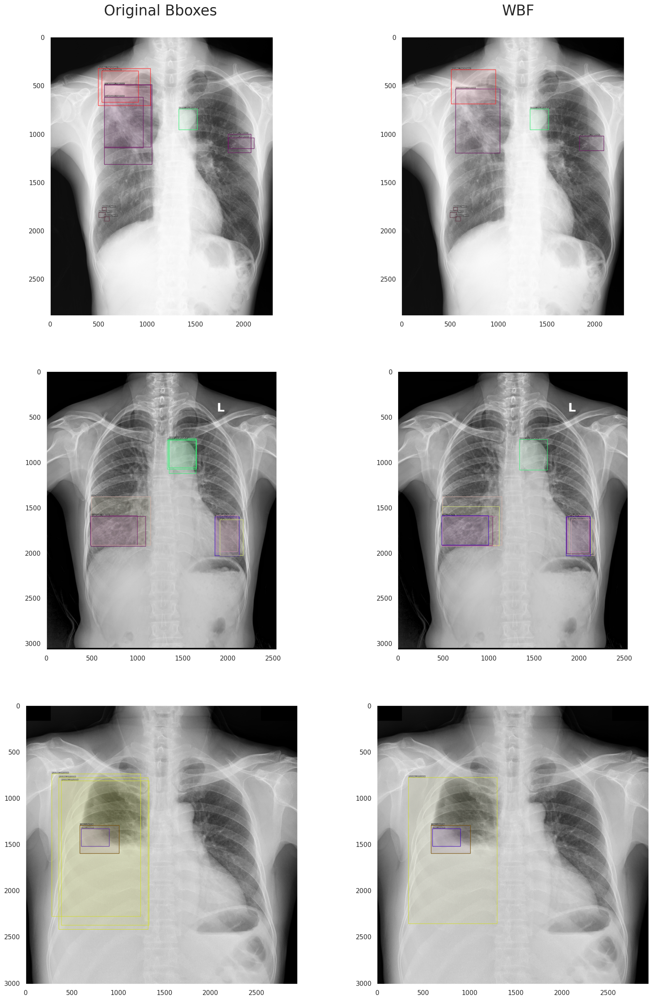

In [13]:
iou_thr = 0.5
skip_box_thr = 0.0001
viz_images = []
sigma = 0.1

for i, path in tqdm(enumerate(imagepaths[5:8])):
    img_array  = cv2.imread(path)
    image_basename = Path(path).stem
    print(f"(\'{image_basename}\', \'{path}\')")
    img_annotations = train_annotations[train_annotations.image_id==image_basename]

    boxes_viz = img_annotations[['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().tolist()
    labels_viz = img_annotations['class_id'].to_numpy().tolist()
    
    print("Bboxes before WBF:\n", boxes_viz)
    print("Labels before WBF:\n", labels_viz)
    
    ## Visualize Original Bboxes
    img_before = img_array.copy()
    for box, label in zip(boxes_viz, labels_viz):
        x_min, y_min, x_max, y_max = (box[0], box[1], box[2], box[3])
        color = label2color[int(label)]
        img_before = draw_bbox(img_before, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_before)
    
    boxes_list = []
    scores_list = []
    labels_list = []
    weights = []
    
    boxes_single = []
    labels_single = []
    
    cls_ids = img_annotations['class_id'].unique().tolist()
    count_dict = Counter(img_annotations['class_id'].tolist())
    print(count_dict)

    for cid in cls_ids:       
        ## Performing Fusing operation only for multiple bboxes with the same label
        if count_dict[cid]==1:
            labels_single.append(cid)
            boxes_single.append(img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy().squeeze().tolist())

        else:
            cls_list =img_annotations[img_annotations.class_id==cid]['class_id'].tolist()
            labels_list.append(cls_list)
            bbox = img_annotations[img_annotations.class_id==cid][['x_min', 'y_min', 'x_max', 'y_max']].to_numpy()
            ## Normalizing Bbox by Image Width and Height
            bbox = bbox/(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
            bbox = np.clip(bbox, 0, 1)
            boxes_list.append(bbox.tolist())
            scores_list.append(np.ones(len(cls_list)).tolist())

            weights.append(1)
            

    # Perform WBF
    boxes, scores, box_labels= weighted_boxes_fusion(boxes_list, scores_list, labels_list, weights=weights,
                                                     iou_thr=iou_thr, skip_box_thr=skip_box_thr)
    
    
    boxes = boxes*(img_array.shape[1], img_array.shape[0], img_array.shape[1], img_array.shape[0])
    boxes = boxes.round(1).tolist()
    box_labels = box_labels.astype(int).tolist()

    boxes.extend(boxes_single)
    box_labels.extend(labels_single)
    
    print("Bboxes after WBF:\n", boxes)
    print("Labels after WBF:\n", box_labels)
    
    ## Visualize Bboxes after operation
    img_after = img_array.copy()
    for box, label in zip(boxes, box_labels):
        color = label2color[int(label)]
        img_after = draw_bbox(img_after, list(np.int_(box)), viz_labels[label], color)
    viz_images.append(img_after)
    print()
        
plot_imgs(viz_images, cmap=None)
plt.figtext(0.3, 0.9,"Original Bboxes", va="top", ha="center", size=25)
plt.figtext(0.73, 0.9,"WBF", va="top", ha="center", size=25)
plt.savefig('wbf.png', bbox_inches='tight')
plt.show()

### Weighted Boxes Fusion seems to give  gives better results comparing to others in this situation considering that we don't have the confidence/weights of the annotations done by different radiologists

# Building YOLO DATASET
## Train, Validation & Test Split

In [14]:
# First, let's add back the images with class_id 14 (no findings)
all_annotations = pd.read_csv("/kaggle/input/vinbigdata-chest-xray-abnormalities-detection/train.csv")
all_annotations['image_path'] = all_annotations['image_id'].map(lambda x:os.path.join('/kaggle/input/vinbigdata-chest-xray-original-png/train', str(x)+'.png'))
all_annotations.head(5)

,image_id,class_name,class_id,rad_id,x_min,y_min,x_max,y_max,image_path
0,50a418190bc3fb1ef1633bf9678929b3,No finding,14,R11,NaN,NaN,NaN,NaN,/kaggle/input/vinbigdata-chest-xray-original-p...
1,21a10246a5ec7af151081d0cd6d65dc9,No finding,14,R7,NaN,NaN,NaN,NaN,/kaggle/input/vinbigdata-chest-xray-original-p...
2,9a5094b2563a1ef3ff50dc5c7ff71345,Cardiomegaly,3,R10,691.0,1375.0,1653.0,1831.0,/kaggle/input/vinbigdata-chest-xray-original-p...
3,051132a778e61a86eb147c7c6f564dfe,Aortic enlargement,0,R10,1264.0,743.0,1611.0,1019.0,/kaggle/input/vinbigdata-chest-xray-original-p...
4,063319de25ce7edb9b1c6b8881290140,No finding,14,R10,NaN,NaN,NaN,NaN,/kaggle/input/vinbigdata-chest-xray-original-p...


In [15]:
# Calculate Class Weights

import numpy as np

# Count the number of annotations per class
class_counts = all_annotations['class_id'].value_counts().to_dict()

# Total number of samples
total_samples = sum(class_counts.values())

# Calculate class weights based on inverse frequency
class_weights = {cls: total_samples / (len(class_counts) * count) for cls, count in class_counts.items()}

print(f"Class Weights: {class_weights}")

Class Weights: {14: 0.14229681312464643, 0: 0.6321697849762636, 3: 0.8342730790491985, 11: 0.9350681536555142, 13: 0.9726315789473684, 8: 1.7548837209302326, 7: 1.8234393878372936, 10: 1.82859450726979, 9: 2.055197458011802, 6: 3.630793905372895, 5: 4.5276, 2: 4.71625, 4: 8.143165467625899, 1: 16.22795698924731, 12: 20.03362831858407}


In [16]:
# Set random seed for reproducibility
np.random.seed(42)

# Get unique image IDs
image_ids = all_annotations['image_id'].unique()

# Split the data
train_ids, temp_ids = train_test_split(image_ids, test_size=0.25, random_state=42)
val_ids, test_ids = train_test_split(temp_ids, test_size=0.2, random_state=42)

print(f"Train set: {len(train_ids)} images")
print(f"Validation set: {len(val_ids)} images")
print(f"Test set: {len(test_ids)} images")

Train set: 11250 images
Validation set: 3000 images
Test set: 750 images


In [17]:
from pathlib import Path

# Create directories for YOLO dataset
yolo_dir = Path('./vinbigdata-yolo-dataset-with-wbf-640px-1class')
yolo_dir.mkdir(exist_ok=True)

for split in ['train', 'val', 'test']:
    (yolo_dir / split / 'images').mkdir(parents=True, exist_ok=True)
    (yolo_dir / split / 'labels').mkdir(parents=True, exist_ok=True)

In [18]:
from typing import List
def ls(path: Path) -> List[Path]:
    return list(path.iterdir())

In [19]:
ls(yolo_dir)

[PosixPath('vinbigdata-yolo-dataset-with-wbf-640px-1class/test'),
 PosixPath('vinbigdata-yolo-dataset-with-wbf-640px-1class/train'),
 PosixPath('vinbigdata-yolo-dataset-with-wbf-640px-1class/val')]

## YoLo Format Overview
### Basic Syntax


Cú pháp cơ bản của định dạng YOLO
Mỗi file nhãn (label file) của YOLO sẽ có cùng tên với file ảnh tương ứng nhưng có phần mở rộng .txt. File này chứa một hoặc nhiều dòng, mỗi dòng mô tả một bounding box cho một đối tượng trong ảnh. Dưới đây là cú pháp cơ bản cho mỗi dòng trong file nhãn:

csharp
Copy code
<object-class> <x_center> <y_center> <width> <height>
Trong đó:

<object-class>: Chỉ số của lớp đối tượng (bắt đầu từ 0). Ví dụ: nếu bạn có 3 lớp: "cat", "dog", và "person", thì "cat" có thể có giá trị 0, "dog" có giá trị 1, và "person" có giá trị 2.
<x_center>: Tọa độ x của tâm bounding box, được chuẩn hóa bằng chiều rộng của ảnh (nằm trong khoảng từ 0 đến 1).
<y_center>: Tọa độ y của tâm bounding box, được chuẩn hóa bằng chiều cao của ảnh (nằm trong khoảng từ 0 đến 1).
<width>: Chiều rộng của bounding box, được chuẩn hóa bằng chiều rộng của ảnh (nằm trong khoảng từ 0 đến 1).
<height>: Chiều cao của bounding box, được chuẩn hóa bằng chiều cao của ảnh (nằm trong khoảng từ 0 đến 1).
Ví dụ về một file YOLO label
Giả sử bạn có một ảnh image1.jpg với kích thước 1024x1024 pixels và file nhãn tương ứng image1.txt có nội dung sau:

Copy code
0 0.5 0.5 0.2 0.3
1 0.7 0.8 0.1 0.1
Giải thích:

Dòng 1: 0 0.5 0.5 0.2 0.3

0: Đây là lớp đối tượng đầu tiên (ví dụ: "cat").
0.5: Tọa độ x của tâm bounding box (50% từ cạnh trái của ảnh).
0.5: Tọa độ y của tâm bounding box (50% từ cạnh trên của ảnh).
0.2: Chiều rộng của bounding box (20% của chiều rộng ảnh).
0.3: Chiều cao của bounding box (30% của chiều cao ảnh).
Dòng 2: 1 0.7 0.8 0.1 0.1

1: Đây là lớp đối tượng thứ hai (ví dụ: "dog").
0.7: Tọa độ x của tâm bounding box (70% từ cạnh trái của ảnh).
0.8: Tọa độ y của tâm bounding box (80% từ cạnh trên của ảnh).
0.1: Chiều rộng của bounding box (10% của chiều rộng ảnh).
0.1: Chiều cao của bounding box (10% của chiều cao ảnh).

In [20]:
# Function to convert bbox to YOLO format
def convert_to_yolo_format(box, img_width, img_height):
    x_center = (box[0] + box[2]) / 2 / img_width
    y_center = (box[1] + box[3]) / 2 / img_height
    width = (box[2] - box[0]) / img_width
    height = (box[3] - box[1]) / img_height
    return [x_center, y_center, width, height]

In [21]:
# Prepare the datasets
viz_images = {
    'train': [],
    'val': [],
    'test': []
}

In [22]:
# # Prepare the datasets
# for split, ids in [('train', train_ids), ('val', val_ids), ('test', test_ids)]:
#     saved_images_count = 0  # Counter to track saved images per split
#     for img_id in tqdm(ids, desc=f"Processing {split} set"):
#         img_annotations = all_annotations[all_annotations.image_id == img_id]
#         img_path = img_annotations.iloc[0]['image_path']
#         img = cv2.imread(img_path)
        
#         # Get original image dimensions
#         orig_height, orig_width = img.shape[:2]
        
#         # Resize the image to 640x640 pixels
#         img = cv2.resize(img, (640, 640))
#         img_height, img_width = 640, 640  # Set the new width and height after resizing
        
#         # Calculate scale factors for width and height
#         width_scale = img_width / orig_width
#         height_scale = img_height / orig_height
        
#         # Save the resized image to the appropriate directory
#         output_img_path = yolo_dir / split / 'images' / f"{img_id}.jpg"
#         cv2.imwrite(str(output_img_path), img)  # Save the resized image
        
#         # Prepare annotations
#         with open(yolo_dir / split / 'labels' / f"{img_id}.txt", 'w') as f:
#             if 14 in img_annotations['class_id'].values:
#                 # No findings case
#                 f.write("14 0.5 0.5 1 1\n")
#             else:
#                 boxes_list = []
#                 scores_list = []
#                 labels_list = []
                
#                 cls_ids = img_annotations['class_id'].unique().tolist()
#                 for cid in cls_ids:
#                     cls_annotations = img_annotations[img_annotations.class_id == cid]
#                     cls_boxes = cls_annotations[['x_min', 'y_min', 'x_max', 'y_max']].values
                    
#                     # Scale bounding box coordinates based on original image size before resize
#                     cls_boxes[:, [0, 2]] = cls_boxes[:, [0, 2]] * width_scale  # Adjust x_min and x_max
#                     cls_boxes[:, [1, 3]] = cls_boxes[:, [1, 3]] * height_scale  # Adjust y_min and y_max
                    
#                     # Normalize box coordinates based on resized image dimensions (1280x1280)
#                     cls_boxes = cls_boxes / [img_width, img_height, img_width, img_height]
#                     cls_boxes = np.clip(cls_boxes, 0, 1)  # Ensure boxes are within bounds
                    
#                     boxes_list.append(cls_boxes.tolist())
#                     scores_list.append(np.ones(len(cls_boxes)).tolist())
#                     labels_list.append([cid] * len(cls_boxes))
                
#                 # Visualize original bounding boxes before WBF
#                 if saved_images_count < 5:  # Only save up to 5 images per split
#                     img_before = img.copy()
                    
#                     # Flatten and ensure all boxes have 4 elements
#                     flat_boxes = [box for sublist in boxes_list for box in sublist if len(box) == 4]
#                     flat_labels = [label for sublist in labels_list for label in sublist]

#                     for box, label in zip(flat_boxes, flat_labels):
#                         # Calculate bounding box coordinates based on resized image dimensions
#                         x_min, y_min, x_max, y_max = np.array(box) * [img_width, img_height, img_width, img_height]
#                         color = label2color[int(label)]
#                         img_before = draw_bbox(img_before, [int(x_min), int(y_min), int(x_max), int(y_max)], viz_labels[int(label)], color)
                    
#                 # Apply WBF (Weighted Boxes Fusion)
#                 boxes, scores, labels = weighted_boxes_fusion(
#                     boxes_list, scores_list, labels_list, 
#                     weights=None, iou_thr=0.5, skip_box_thr=0.0001
#                 )
                
#                 # Write YOLO format annotations
#                 for box, label in zip(boxes, labels):
#                     # YOLO expects normalized coordinates, so we don't need to scale them back
#                     yolo_box = convert_to_yolo_format(box, 1, 1)  # already normalized
#                     f.write(f"{int(label)} {' '.join(map(str, yolo_box))}\n")
#                 # Findings case
#                 f.write("15 0.5 0.5 1 1\n")
                
#                 # Visualize bounding boxes after WBF
#                 if saved_images_count < 5:  # Only save up to 5 images per split
#                     img_after = img.copy()
#                     for box, label in zip(boxes, labels):
#                         # Calculate bounding box coordinates based on resized image dimensions
#                         x_min, y_min, x_max, y_max = np.array(box) * [img_width, img_height, img_width, img_height]
#                         color = label2color[int(label)]
#                         img_after = draw_bbox(img_after, [int(x_min), int(y_min), int(x_max), int(y_max)], viz_labels[int(label)], color)
                    
#                     # Append both images (before and after WBF) to visualization list
#                     viz_images[split].append((img_before, img_after))
#                     saved_images_count += 1

# print("YOLO dataset creation and visualization completed.")

In [23]:
# Prepare the datasets
for split, ids in [('train', train_ids), ('val', val_ids), ('test', test_ids)]:
    saved_images_count = 0  # Counter to track saved images per split
    for img_id in tqdm(ids, desc=f"Processing {split} set"):
        img_annotations = all_annotations[all_annotations.image_id == img_id]
        img_path = img_annotations.iloc[0]['image_path']
        img = cv2.imread(img_path)

        if img is None:
            print(f"Could not read image: {img_path}")
            continue

        # Get original image dimensions
        orig_height, orig_width = img.shape[:2]

        # Resize the image to 640x640 pixels
        img = cv2.resize(img, (640, 640))
        img_height, img_width = 640, 640  # Set the new width and height after resizing

        # Calculate scale factors for width and height
        width_scale = img_width / orig_width
        height_scale = img_height / orig_height

        # Save the resized image to the appropriate directory
        output_img_path = yolo_dir / split / 'images' / f"{img_id}.jpg"
        cv2.imwrite(str(output_img_path), img)  # Save the resized image

        # Prepare annotations
        label_path = yolo_dir / split / 'labels' / f"{img_id}.txt"
        annotations_exist = False  # Flag to check if there are valid annotations

        with open(label_path, 'w') as f:
            # Case 1: No findings (class_id = 14), vì xuất ra 2class nên chuyển thành id 1
            if 14 in img_annotations['class_id'].values:
                # f.write("14 0.5 0.5 1 1\n")
                f.write("1 0.5 0.5 1 1\n")
                annotations_exist = True

            # Case 2: Aortic enlargement (class_id = 0)
            aortic_annotations = img_annotations[img_annotations['class_id'] == 0]
            boxes_list = []  # Store bounding boxes for visualization

            for _, ann in aortic_annotations.iterrows():
                x_min, y_min, x_max, y_max = ann[['x_min', 'y_min', 'x_max', 'y_max']].values

                # Scale bounding box coordinates based on original image size before resize
                x_min *= width_scale
                x_max *= width_scale
                y_min *= height_scale
                y_max *= height_scale

                # Normalize box coordinates based on resized image dimensions
                x_center = (x_min + x_max) / 2 / img_width
                y_center = (y_min + y_max) / 2 / img_height
                box_width = (x_max - x_min) / img_width
                box_height = (y_max - y_min) / img_height

                # Append box to list for visualization
                boxes_list.append([x_min, y_min, x_max, y_max])

                # Write normalized YOLO format annotation
                f.write(f"0 {x_center} {y_center} {box_width} {box_height}\n")
                annotations_exist = True

            # Visualization for each image in Case 2: Aortic enlargement
            if saved_images_count < 5 and annotations_exist:
                img_before = img.copy()
                img_after = img.copy()  # Placeholder for after WBF visualization

                for box in boxes_list:
                    # Draw bounding boxes on img_before
                    x_min, y_min, x_max, y_max = map(int, box)
                    color = (0, 255, 0)  # Green for visualization
                    img_before = cv2.rectangle(img_before, (x_min, y_min), (x_max, y_max), color, 2)
                    img_before = cv2.putText(img_before, "Aortic_enlargement", (x_min, y_min - 10),
                                             cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

                # Example for img_after (you can apply WBF here if needed)
                for box in boxes_list:
                    # Draw bounding boxes on img_after
                    x_min, y_min, x_max, y_max = map(int, box)
                    color = (255, 0, 0)  # Red for visualization after WBF
                    img_after = cv2.rectangle(img_after, (x_min, y_min), (x_max, y_max), color, 2)
                    img_after = cv2.putText(img_after, "Aortic_enlargement (After)", (x_min, y_min - 10),
                                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

                # Append both images (before and after) to visualization list
                viz_images[split].append((img_before, img_after))
                saved_images_count += 1

        # Remove label file if no annotations exist
        if not annotations_exist:
            os.remove(label_path)

print("YOLO dataset creation with visualization for Aortic enlargement completed.")

Processing train set:   0%|          | 0/11250 [00:00<?, ?it/s]

Processing val set:   0%|          | 0/3000 [00:00<?, ?it/s]

Processing test set:   0%|          | 0/750 [00:00<?, ?it/s]

YOLO dataset creation with visualization for Aortic enlargement completed.


In [24]:
# # Prepare the datasets
# for split, ids in [('train', train_ids), ('val', val_ids), ('test', test_ids)]:
#     saved_images_count = 0  # Counter to track saved images per split
#     for img_id in tqdm(ids, desc=f"Processing {split} set"):
#         img_annotations = all_annotations[all_annotations.image_id == img_id]
#         img_path = img_annotations.iloc[0]['image_path']
#         img = cv2.imread(img_path)
        
#         # Get original image dimensions
#         orig_height, orig_width = img.shape[:2]
        
#         # Resize the image to 640x640 pixels
#         img = cv2.resize(img, (640, 640))
#         img_height, img_width = 640, 640  # Set the new width and height after resizing
        
#         # Calculate scale factors for width and height
#         width_scale = img_width / orig_width
#         height_scale = img_height / orig_height
        
#         # Save the resized image to the appropriate directory
#         output_img_path = yolo_dir / split / 'images' / f"{img_id}.jpg"
#         cv2.imwrite(str(output_img_path), img)  # Save the resized image
        
#         # Prepare annotations
#         with open(yolo_dir / split / 'labels' / f"{img_id}.txt", 'w') as f:
#             if 14 in img_annotations['class_id'].values:
#                 # No findings case
#                 f.write("14 0.5 0.5 1 1\n")
#             else:
#                 boxes_list = []
#                 scores_list = []
#                 labels_list = []
                
#                 aortic_annotations = img_annotations[img_annotations['class_id'] == 0]
#                 for cid in aortic_annotations:
#                     cls_annotations = img_annotations[img_annotations.class_id == cid]
#                     cls_boxes = cls_annotations[['x_min', 'y_min', 'x_max', 'y_max']].values
                    
#                     # Scale bounding box coordinates based on original image size before resize
#                     cls_boxes[:, [0, 2]] = cls_boxes[:, [0, 2]] * width_scale  # Adjust x_min and x_max
#                     cls_boxes[:, [1, 3]] = cls_boxes[:, [1, 3]] * height_scale  # Adjust y_min and y_max
                    
#                     # Normalize box coordinates based on resized image dimensions (1280x1280)
#                     cls_boxes = cls_boxes / [img_width, img_height, img_width, img_height]
#                     cls_boxes = np.clip(cls_boxes, 0, 1)  # Ensure boxes are within bounds
                    
#                     boxes_list.append(cls_boxes.tolist())
#                     scores_list.append(np.ones(len(cls_boxes)).tolist())
#                     labels_list.append([cid] * len(cls_boxes))
                
#                 # Visualize original bounding boxes before WBF
#                 if saved_images_count < 5:  # Only save up to 5 images per split
#                     img_before = img.copy()
                    
#                     # Flatten and ensure all boxes have 4 elements
#                     flat_boxes = [box for sublist in boxes_list for box in sublist if len(box) == 4]
#                     flat_labels = [label for sublist in labels_list for label in sublist]

#                     for box, label in zip(flat_boxes, flat_labels):
#                         # Calculate bounding box coordinates based on resized image dimensions
#                         x_min, y_min, x_max, y_max = np.array(box) * [img_width, img_height, img_width, img_height]
#                         color = label2color[int(label)]
#                         img_before = draw_bbox(img_before, [int(x_min), int(y_min), int(x_max), int(y_max)], viz_labels[int(label)], color)
                    
#                 # Apply WBF (Weighted Boxes Fusion)
#                 boxes, scores, labels = weighted_boxes_fusion(
#                     boxes_list, scores_list, labels_list, 
#                     weights=None, iou_thr=0.5, skip_box_thr=0.0001
#                 )
                
#                 # Write YOLO format annotations
#                 for box, label in zip(boxes, labels):
#                     # YOLO expects normalized coordinates, so we don't need to scale them back
#                     yolo_box = convert_to_yolo_format(box, 1, 1)  # already normalized
#                     f.write(f"{int(label)} {' '.join(map(str, yolo_box))}\n")
#                 # Findings case
#                 f.write("15 0.5 0.5 1 1\n")
                
#                 # Visualize bounding boxes after WBF
#                 if saved_images_count < 5:  # Only save up to 5 images per split
#                     img_after = img.copy()
#                     for box, label in zip(boxes, labels):
#                         # Calculate bounding box coordinates based on resized image dimensions
#                         x_min, y_min, x_max, y_max = np.array(box) * [img_width, img_height, img_width, img_height]
#                         color = label2color[int(label)]
#                         img_after = draw_bbox(img_after, [int(x_min), int(y_min), int(x_max), int(y_max)], viz_labels[int(label)], color)
                    
#                     # Append both images (before and after WBF) to visualization list
#                     viz_images[split].append((img_before, img_after))
#                     saved_images_count += 1

# print("YOLO dataset creation and visualization completed.")

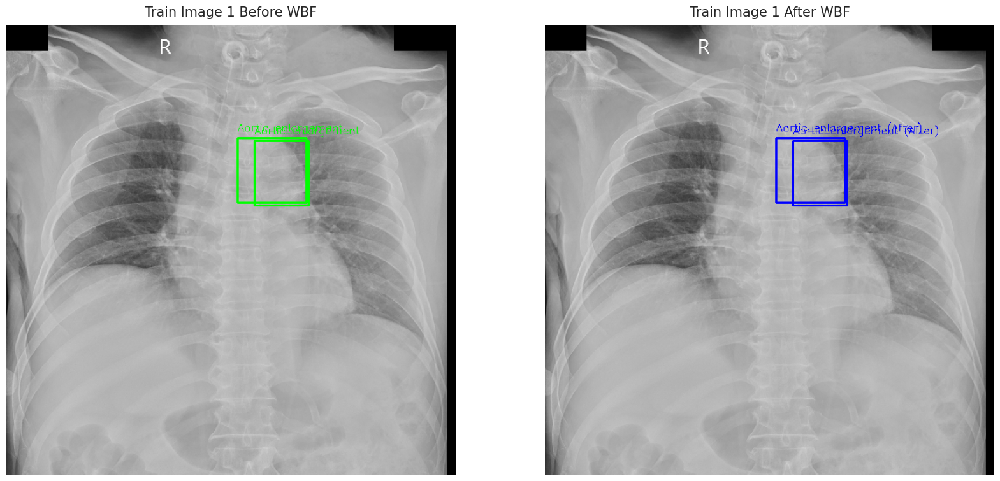

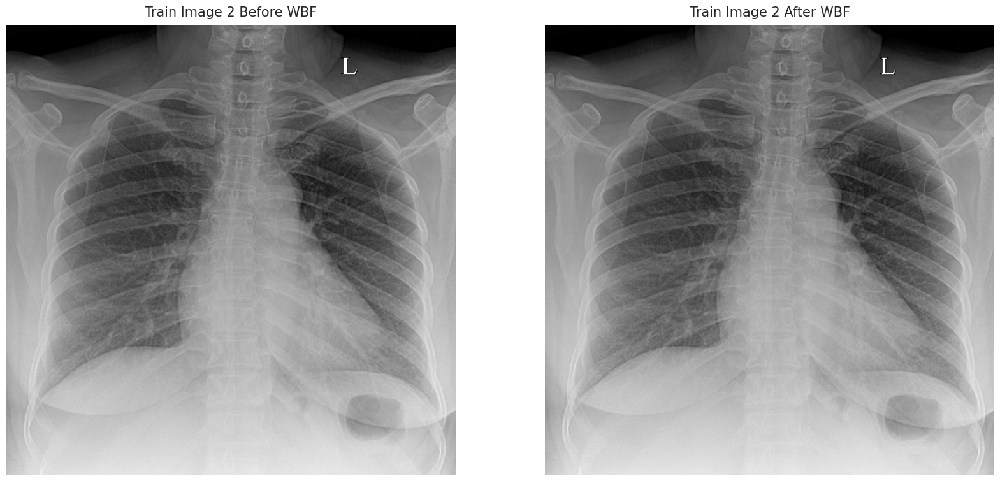

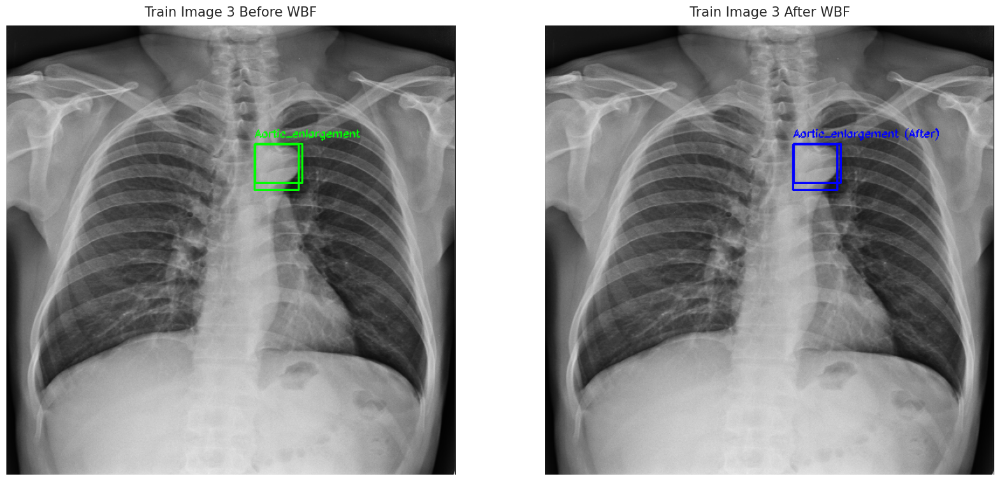

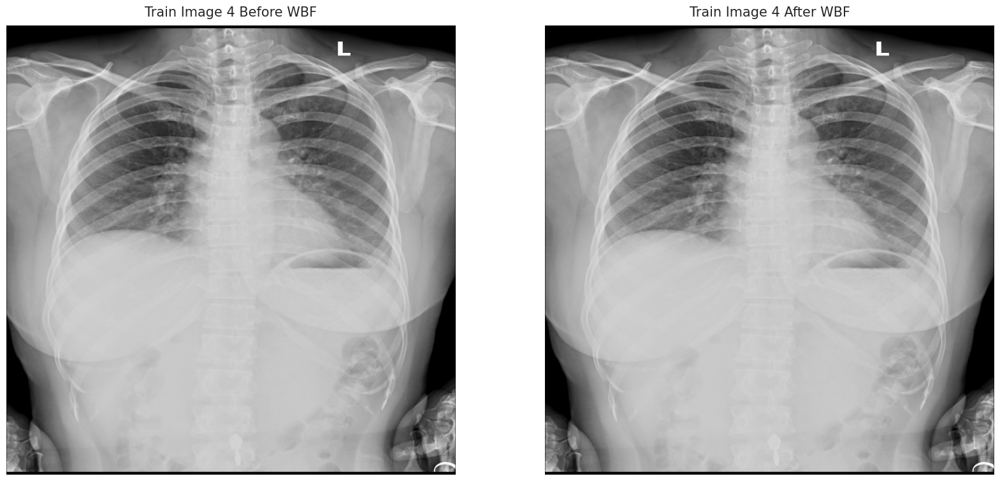

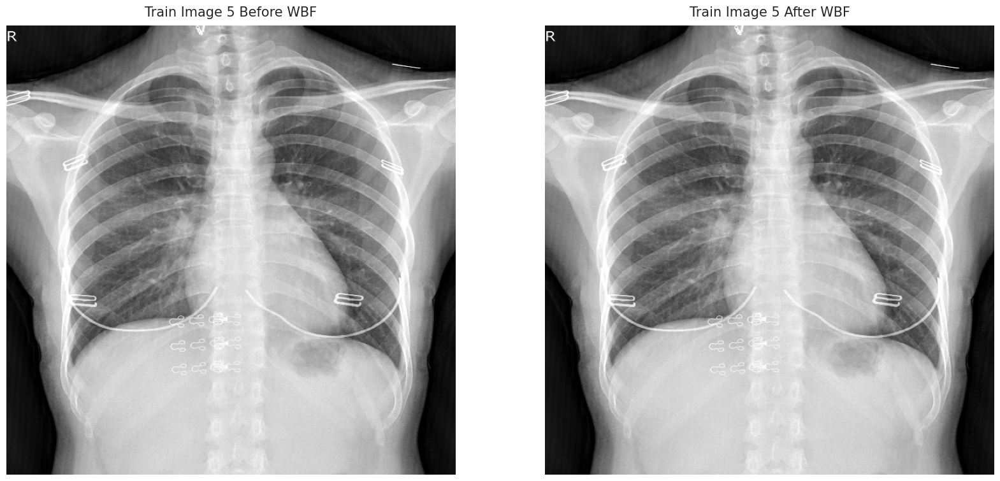

...

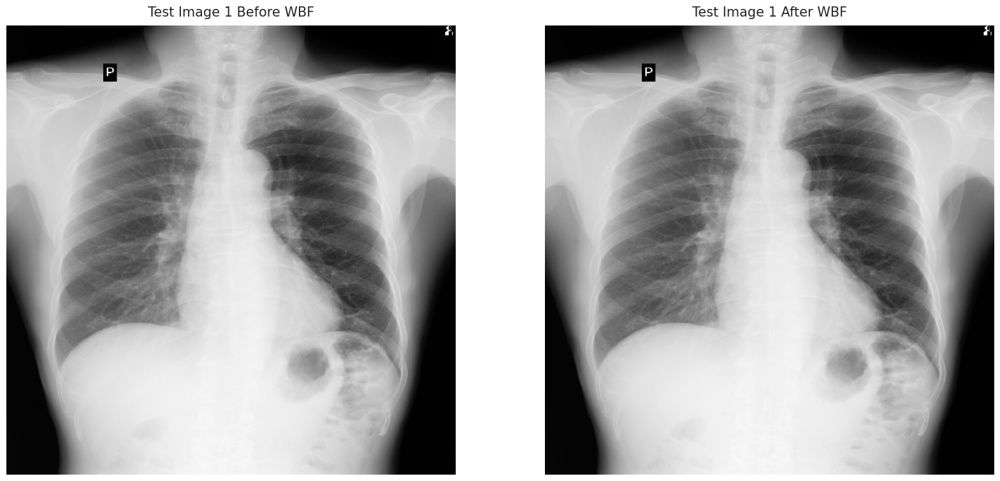

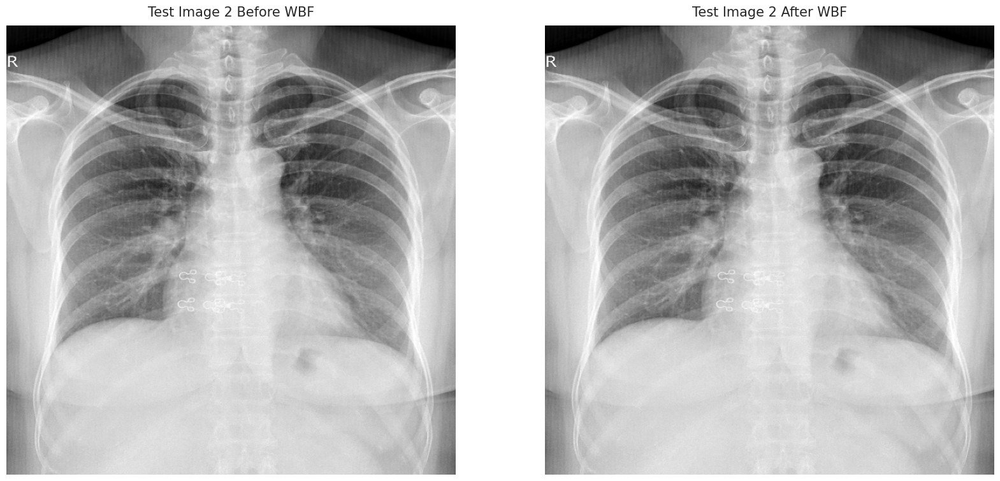

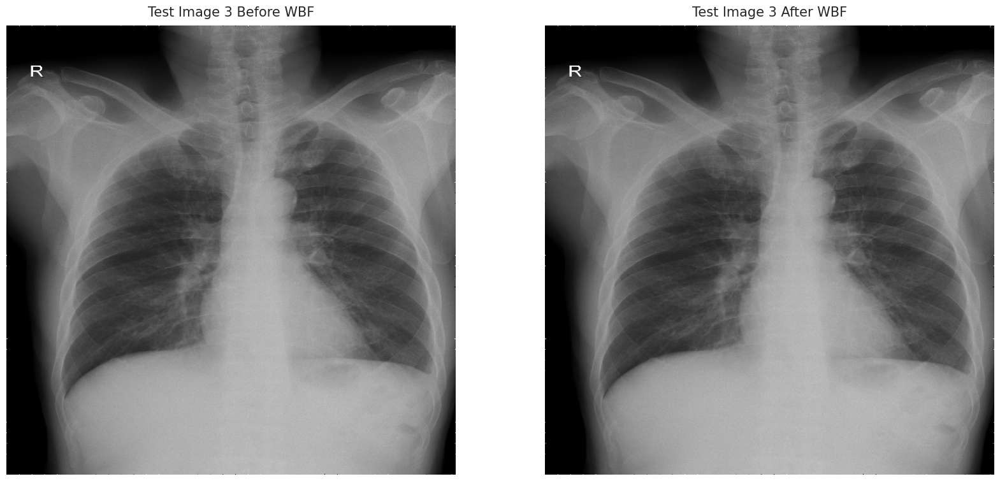

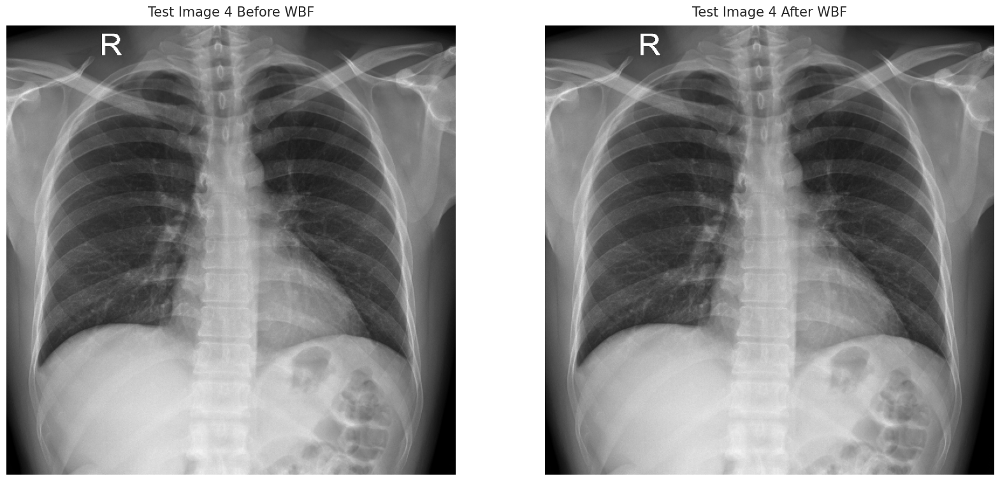

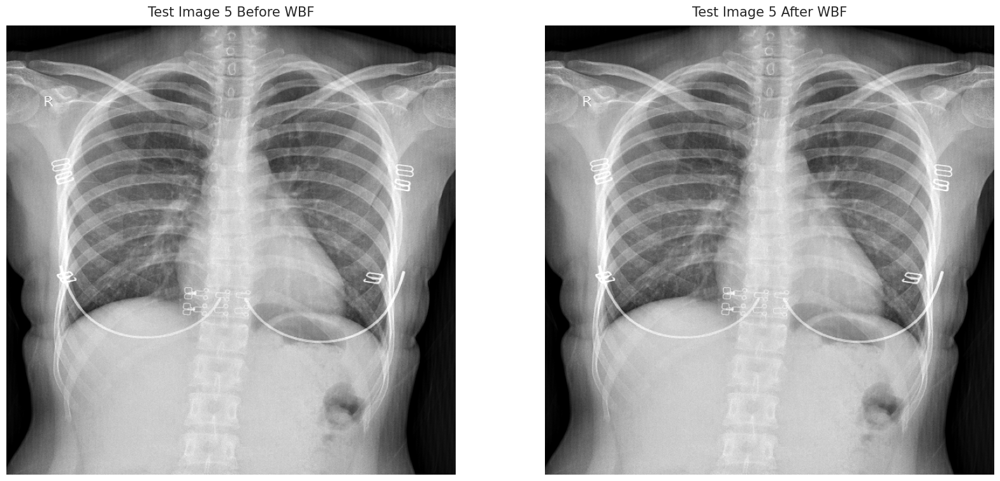

In [25]:
# Visualize and save images before and after WBF
for split, images in viz_images.items():
    for idx, (img_before, img_after) in enumerate(images):
        plt.figure(figsize=(20, 10))

        # Plot image before WBF
        plt.subplot(1, 2, 1)
        plt.imshow(cv2.cvtColor(img_before, cv2.COLOR_BGR2RGB))
        plt.title(f"{split.capitalize()} Image {idx+1} Before WBF")
        plt.axis('off')

        # Plot image after WBF
        plt.subplot(1, 2, 2)
        plt.imshow(cv2.cvtColor(img_after, cv2.COLOR_BGR2RGB))
        plt.title(f"{split.capitalize()} Image {idx+1} After WBF")
        plt.axis('off')

        plt.savefig(f'{split}_image_{idx+1}_comparison.png', bbox_inches='tight')
        plt.show()

In [26]:
# # Visualize and save images before and after WBF
# for split, images in viz_images.items():
#     for idx, (img_before, img_after) in enumerate(images):
#         plt.figure(figsize=(20, 10))

#         # Plot image before WBF
#         plt.subplot(1, 2, 1)
#         plt.imshow(cv2.cvtColor(img_before, cv2.COLOR_BGR2RGB))
#         plt.title(f"{split.capitalize()} Image {idx+1} Before WBF")
#         plt.axis('off')

#         # Plot image after WBF
#         plt.subplot(1, 2, 2)
#         plt.imshow(cv2.cvtColor(img_after, cv2.COLOR_BGR2RGB))
#         plt.title(f"{split.capitalize()} Image {idx+1} After WBF")
#         plt.axis('off')

#         plt.savefig(f'{split}_image_{idx+1}_comparison.png', bbox_inches='tight')
#         plt.show()

In [27]:
# Create train.txt, val.txt, and test.txt
for split in ['train', 'val', 'test']:
    with open(yolo_dir / f"{split}.txt", 'w') as f:
        for img_path in (yolo_dir / split / 'images').glob('*.jpg'):
            # Replace "working" in img_path with the specified value
            modified_img_path = str(img_path.absolute()).replace("working", "input/vinbigdata-yolo-dataset-with-wbf-640px-1class")
            f.write(f"{modified_img_path}\n")

print("Dataset split files created.")

Dataset split files created.


In [28]:
data_input_dir = Path("/kaggle/input/vinbigdata-yolo-dataset-with-wbf-640px-1class/vinbigdata-yolo-dataset-with-wbf-640px-1class")

# # Create data.yaml file
# data_yaml = f"""
# train: {(data_input_dir / 'train.txt')}
# val: {(data_input_dir / 'val.txt')}
# test: {(data_input_dir / 'test.txt')}

# nc: {len(viz_labels) + 1}  # +1 for the "no finding" class
# names: {viz_labels + ['No finding']}
# """

# with open(yolo_dir / 'data.yaml', 'w') as f:
#     f.write(data_yaml)

# print("data.yaml file created.")

# Add class weights to the YAML configuration
class_weight_list = [class_weights[cls] for cls in sorted(class_weights.keys())]

data_yaml = f"""
train: {(data_input_dir / 'train.txt')}
val: {(data_input_dir / 'val.txt')}
test: {(data_input_dir / 'test.txt')}

nc: {2}  # 2 for bệnh động mạch vành + ['No finding']
names: {['Aortic_enlargement'] + ['No finding']}
# class_weights: {class_weight_list}
"""

with open(yolo_dir / 'data.yaml', 'w') as f:
    f.write(data_yaml)

print("data.yaml file with class weights created.")

data.yaml file with class weights created.


<object-class> <x_center> <y_center> <width> <height>


In [29]:
warnings.filterwarnings("ignore", category=UserWarning)

In [30]:
!find ./vinbigdata-yolo-dataset-with-wbf-640px-1class/train -type f | wc -l

21515


In [31]:
!find ./vinbigdata-yolo-dataset-with-wbf-640px-1class/val -type f | wc -l

5731


In [32]:
!find ./vinbigdata-yolo-dataset-with-wbf-640px-1class/test -type f | wc -l

1427


### Packaging Dataset into Zip for Upload

In [33]:
%%bash
cd ./vinbigdata-yolo-dataset-with-wbf-640px-1class
zip -rq ../vinbigdata-yolo-dataset-with-wbf-640px-1class.zip ./*
echo "Zipping completed successfully."

Zipping completed successfully.


In [34]:
%%bash
rm -r ./vinbigdata-yolo-dataset-with-wbf-640px-1class
ls -ahl

total 1.7G
drwxr-xr-x 2 root root 4.0K Jan  1 15:53 .
drwxr-xr-x 6 root root 4.0K Jan  1 15:18 ..
-rw-r--r-- 1 root root 1.2M Jan  1 15:18 nms.png
-rw-r--r-- 1 root root 1.2M Jan  1 15:19 nmw.png
---------- 1 root root  17M Jan  1 15:53 __notebook__.ipynb
-rw-r--r-- 1 root root 1.2M Jan  1 15:19 snms.png
-rw-r--r-- 1 root root 292K Jan  1 15:51 test_image_1_comparison.png
-rw-r--r-- 1 root root 440K Jan  1 15:51 test_image_2_comparison.png
-rw-r--r-- 1 root root 373K Jan  1 15:52 test_image_3_comparison.png
-rw-r--r-- 1 root root 390K Jan  1 15:52 test_image_4_comparison.png
-rw-r--r-- 1 root root 467K Jan  1 15:52 test_image_5_comparison.png
-rw-r--r-- 1 root root 364K Jan  1 15:51 train_image_1_comparison.png
-rw-r--r-- 1 root root 391K Jan  1 15:51 train_image_2_comparison.png
-rw-r--r-- 1 root root 420K Jan  1 15:51 train_image_3_comparison.png
-rw-r--r-- 1 root root 349K Jan  1 15:51 train_image_4_comparison.png
-rw-r--r-- 1 root root 453K Jan  1 15:51 train_image_5_comparison.png

<p style='text-align: center;'><span style="color: #0D0D0D; font-family: Segoe UI; font-size: 2.0em; font-weight: 300;">THANK YOU! PLEASE UPVOTE</span></p>

<p style='text-align: center;'><span style="color: #0D0D0D; font-family: Segoe UI; font-size: 2.5em; font-weight: 300;">HOPE IT WAS USEFUL</span></p>

<p style='text-align: center;'><span style="color: #009BAE; font-family: Segoe UI; font-size: 1.2em; font-weight: 300;">Check out the Train Notebook below</span></p>



<p style='text-align: center;'><span style="font-family: Trebuchet MS; font-size: 1.3em;"><a href="https://www.kaggle.com/code/buithanhxuan/vincxr-yolov8l" target="_top">vincxr-yolov8l⚡📈</a></span></p>

<p style='text-align: center;'></p>
